In [33]:
import sys
import yaml
import os

import cv2
import torch
from torch.autograd import Variable

from models.yolov3 import *
from utils.utils import *
from utils.parse_yolo_weights import parse_yolo_weights
from utils.vis_bbox import vis_bbox

import matplotlib.pyplot as plt
%matplotlib inline

In [34]:
# Choose config file for this demo
cfg_path = './config/gaussian_yolov3_eval.cfg'

# Specify checkpoint file which contains the weight of the model you want to use
ckpt_path = './gaussian_yolov3_coco.pth'

# Path to the image file fo the demo
image_folder = './data/gaussian_yolov3'

image_names = [
    "car_1.jpg",
    "car_2.jpg",
    "car_3.jpg",
    "car_4.jpg",
]

image_paths = [os.path.join(image_folder, img) for img in image_names]

# Detection threshold
detect_thresh = 0.3

# Use CPU if gpu < 0 else use GPU
gpu = -1

num_classes = 80

In [23]:
# Load configratio parameters for this demo
with open(cfg_path, 'r') as f:
    cfg = yaml.safe_load(f)

model_config = cfg['MODEL']
imgsize = cfg['TEST']['IMGSIZE']
confthre = cfg['TEST']['CONFTHRE'] 
nmsthre = cfg['TEST']['NMSTHRE']
gaussian = cfg['MODEL']['GAUSSIAN']

# if detect_thresh is not specified, the parameter defined in config file is used
if detect_thresh:
    confthre = detect_thresh

In [24]:
# Load model
model = YOLOv3(model_config)

# Load weight from the checkpoint
print("loading checkpoint %s" % (ckpt_path))
state = torch.load(ckpt_path)

if 'model_state_dict' in state.keys():
    model.load_state_dict(state['model_state_dict'])
else:
    model.load_state_dict(state)

model.eval()

if gpu >= 0:
    # Send model to GPU
    model.cuda()

Gaussian YOLOv3
Gaussian YOLOv3
Gaussian YOLOv3
loading checkpoint ./gaussian_yolov3_coco.pth


In [25]:
model

YOLOv3(
  (module_list): ModuleList(
    (0): Sequential(
      (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (batch_norm): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (leaky): LeakyReLU(negative_slope=0.1)
    )
    (1): Sequential(
      (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (batch_norm): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (leaky): LeakyReLU(negative_slope=0.1)
    )
    (2): resblock(
      (module_list): ModuleList(
        (0): ModuleList(
          (0): Sequential(
            (conv): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (batch_norm): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (leaky): LeakyReLU(negative_slope=0.1)
          )
          (1): Sequential(
            (conv): Conv2d(32, 64, kernel_size=(3, 3),

In [66]:
def preprocess_image(image_path):
    # Load image
    img = cv2.imread(image_path)

    # Preprocess image
    img_raw = img.copy()[:, :, ::-1].transpose((2, 0, 1))
    img, info_img = preprocess(img, imgsize, jitter=0)  # info = (h, w, nh, nw, dx, dy)
    img = np.transpose(img / 255., (2, 0, 1))
    img = torch.from_numpy(img).float().unsqueeze(0)

    if gpu >= 0:
        # Send model to GPU
        img = Variable(img.type(torch.cuda.FloatTensor))
    else:
        img = Variable(img.type(torch.FloatTensor))
    
    return img, img_raw, info_img

In [68]:
images = [preprocess_image(img) for img in image_paths]
images_tensor = torch.cat([img[0] for img in images])


In [53]:
# Inference
with torch.no_grad():
    outputs = model(images_tensor)

    print(f"***Before post-processing***")
    print(f"What is outputs? It is a {type(outputs)}")
    print(f"What is the shape of the prediction? {outputs.shape}")
    print("\n----------------------------------------------------\n")

    outputs = postprocess(
        prediction=outputs,
        num_classes=num_classes,
        conf_thre=confthre,
        nms_thre=nmsthre
        )
    
    print(f"***After post-processing***")
    print(f"What is outputs? It is a {type(outputs)}")
    print(f"How many elements does it have? {len(outputs)} → It is the batch_size")
    print(f"What is the shape of each prediction?")
    for i, bbox in enumerate(outputs):
        print(i, bbox.shape)



***Before post-processing***
What is outputs? It is a <class 'torch.Tensor'>
What is the shape of the prediction? torch.Size([4, 10647, 89])

----------------------------------------------------

***After post-processing***
What is outputs? It is a <class 'list'>
How many elements does it have? 4 → It is the batch_size
What is the shape of each prediction?
0 torch.Size([1, 11])
1 torch.Size([1, 11])
2 torch.Size([1, 11])
3 torch.Size([1, 11])


The content of each line of post-processed prediction is the following:

![](./Gaussian_prediction.png)



In [82]:
def plot_prediction(outputs, img_raw, info_img, visualize_img=True, save_name="demo.jpg", show_inner_bounding_box=False):
    # Prepare structures for plotting the prediction

    if outputs[0] is None:
        print("No Objects Deteted!!")
        sys.exit(0)

    # Visualize detected bboxes
    coco_class_names, coco_class_ids, coco_class_colors = get_coco_label_names()

    bboxes = list()
    classes = list()
    scores = list()
    colors = list()
    sigmas = list()

    for output in outputs:
        x1, y1, x2, y2, conf, cls_conf, cls_pred = output[:7]
        if gaussian:
            sigma_x, sigma_y, sigma_w, sigma_h = output[7:]
            sigmas.append([sigma_x, sigma_y, sigma_w, sigma_h])

        cls_id = coco_class_ids[int(cls_pred)]
        box = yolobox2label([y1, x1, y2, x2], info_img)
        bboxes.append(box)
        classes.append(cls_id)
        scores.append(cls_conf * conf)
        colors.append(coco_class_colors[int(cls_pred)])
        
        # image size scale used for sigma visualization
        h, w, nh, nw, _, _ = info_img
        sigma_scale_img = (w / nw, h / nh)
        
    fig, ax = vis_bbox(
        img_raw, bboxes, label=classes, score=scores, label_names=coco_class_names, sigma=sigmas, 
        sigma_scale_img=sigma_scale_img,
        sigma_scale_xy=2., sigma_scale_wh=2.,  # 2-sigma
        show_inner_bound=show_inner_bounding_box,  # do not show inner rectangle for simplicity
        instance_colors=colors, linewidth=3)

    if visualize_img:
        plt.show()
    else:
        fig.savefig(save_name)


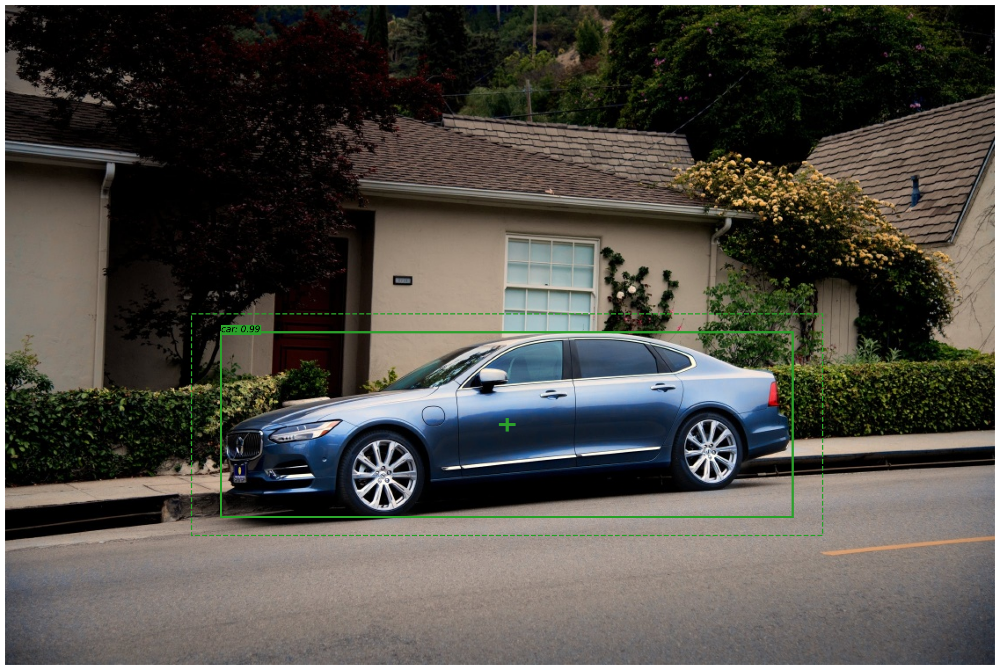

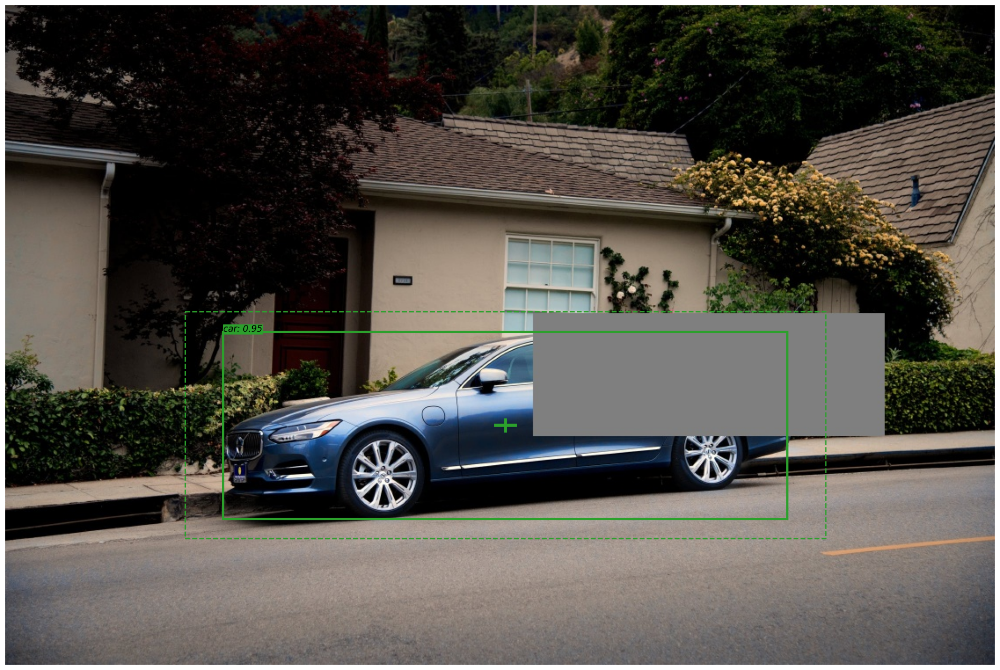

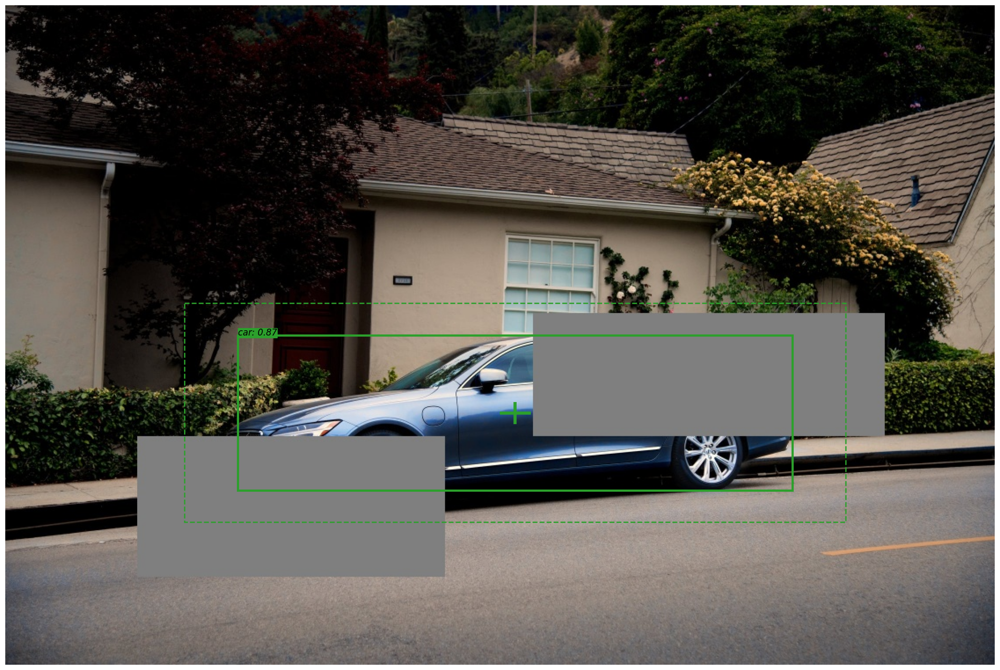

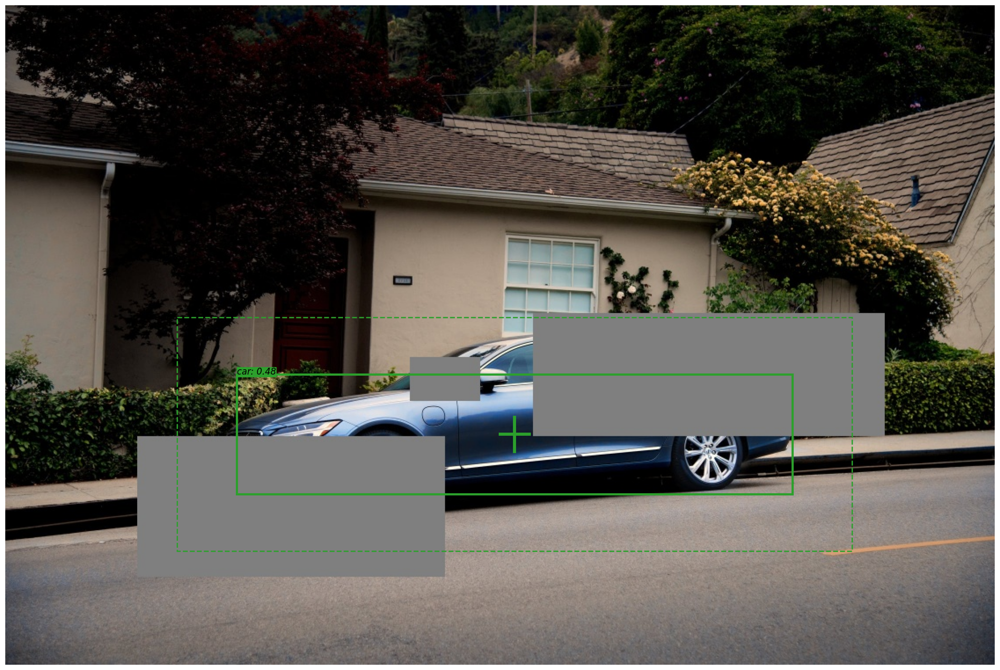

In [83]:
# output → output from model
# images → contain preprocessed image tensor, copy of original image, and image info
for i, (output, (_, img_raw, info_img)) in enumerate(zip(outputs, images)):
    plot_prediction(output, img_raw, info_img, visualize_img=False, save_name=f"{i}.jpg", show_inner_bounding_box=False)